# Check TNS

Compare DESITRIP alerts from the daily cronjobs to public classified and/or unclassified alerts pushed to [TNS](https://www.wis-tns.org).
- Contact for the daily cronjobs: [Antonella Palmese](mailto:antonella.palmese@gmail.com)
- Contact for questions about DESITRIP: [Segev BenZvi](mailto:sbenzvi@ur.rochester.edu)

In [1]:
from desispec.io import read_spectra

from astropy import units as u
from astropy.table import Table, vstack, hstack
from astropy.coordinates import SkyCoord, match_coordinates_sky
from astropy.wcs import WCS
from astropy.visualization.wcsaxes import SphericalCircle

from datetime import datetime, timedelta

from scipy.ndimage import gaussian_filter1d

import os
from glob import glob

import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

In [2]:
mpl.rc('font', size=14)
mpl.rc('figure', max_open_warning = 0)

## Some Plotting Functions for Later Use

In [3]:
def plot_radec(ra, dec):
    """Mollweide projection plot adapted to astro coordinates.
    
    Parameters
    ----------
    ra : pandas.Series or list
        List of candidate RA [deg].
    dec : pandas.Series or list
        List of candidate Dec [deg].
    
    Returns
    -------
    fig : matplotlib.Figure
        Figure object to let user apply further plot manipulation.
    """
    # Convert RA, Dec to radians.
    # Rotate the RA so that the plot goes 360->0 left to right.
    _ra = np.radians(180 - ra)
    _dec = np.radians(dec)

    fig, ax = plt.subplots(1,1, figsize=(8,4), subplot_kw={'projection': 'mollweide'})
    ax.scatter(_ra, _dec, alpha=0.5)
    ax.set(xticks=np.radians([-150, -120, -90, -60, -30, 0, 30, 60, 90, 120, 150]),
           xticklabels=['22h', '20h', '18h', '16h', '14h', '12h', '10h', '8h', '6h', '4h', '2h'])
    ax.tick_params(axis='x', labelsize=10)
    ax.tick_params(axis='y', labelsize=10)
    ax.grid(ls=':')
    fig.tight_layout()
    
    return fig;

In [4]:
import requests

def get_cutout(targetid, ra, dec, verbose=False):
    """Grab and cache legacy survey cutouts.
    
    Parameters
    ----------
    targetid : int
        DESI target ID.
    ra : float
        Right ascension (degrees).
    dec : float
        Declination (degrees).
    verbose : bool
        Add some status messages if true.
        
    Returns
    -------
    img_name : str
        Name of JPG cutout file written after query.
    w : astropy.wcs.WCS
        World coordinate system for the image.
    """
    # Either load an existing image or download a cutout.
    os.makedirs('_cache', exist_ok=True)
    img_name = f'_cache/cutout_{targetid}.jpg'
    
    if os.path.exists(img_name):
        if verbose:
            print('{} exists.'.format(img_name))
    else:
        if verbose:
            print('Accessing {}'.format(img_name))
        img_url = 'https://www.legacysurvey.org/viewer/cutout.jpg?ra={}&dec={}&%22/pix=0.25&layer=dr8&size=180'.format(ra, dec)
        with open(img_name, 'wb') as handle: 
            response = requests.get(img_url, stream=True) 
            if not response.ok: 
                print(response) 
            for block in response.iter_content(1024): 
                if not block: 
                    break 
                handle.write(block)
                
    # Set up the WCS.
    wcs_input_dict = {
        'CTYPE1': 'RA---TAN',
        'CUNIT1': 'deg',
        'CDELT1': -0.25/3600,
        'CRPIX1': 90,
        'CRVAL1': ra,
        'NAXIS1': 180,
        'CTYPE2': 'DEC--TAN',
        'CUNIT2': 'deg',
        'CDELT2': 0.25/3600,
        'CRPIX2': 90,
        'CRVAL2': dec,
        'NAXIS2': 180
    }
    w = WCS(wcs_input_dict)
    
    return img_name, w

In [5]:
# Emission and absorption lines from Prospect tables.
emi_lines = Table.read('emission_lines.txt', format='ascii', comment='#', names=['name','longname','lambda','vacuum','major'])
abs_lines = Table.read('absorption_lines.txt', format='ascii', comment='#', names=['name','longname','lambda','vacuum','major'])

emi_lines_major = emi_lines[emi_lines['major']=='True']
abs_lines_major = abs_lines[abs_lines['major']=='True']

In [6]:
def plot_alert_spectra(spectab, specpath='/global/project/projectdirs/desi/science/td/daily-search/desitrip/out', savefig=False):
    """Plot spectra and image cutouts from a selected table.
    
    Paramters
    ---------
    spectab : astropy.Table
        Table of spectrum properties: merger of DESITRIP + TNS object data.
    specpath : str
        Path on disk to spectrum files created by DESITRIP.
    savefig : bool
        If true, save figures to a output files (PNG format).
    """
    for spec in spectab:
        specfile = f'{specpath}/transient_candidate_spectra_{spec["NIGHT"]}_{spec["TILEID"]}.fits'
        spectra = read_spectra(specfile)
        idx = np.argwhere(np.in1d(spectra.fibermap['TARGETID'], spec['TARGETID']))[0][0]
        
        fmap = spectra.fibermap[idx]
        targetid = fmap['TARGETID']
        ra, dec = fmap['TARGET_RA'], fmap['TARGET_DEC']
        night = spec['NIGHT']
        z = fmap['Z']
        
        dtlabel = spec['CNNLABEL']
        name = spec['Name']
        objtype = spec['Obj. Type']
        
        wave = spectra.wave['brz']
        flux = spectra.flux['brz'][idx]
        restwave = wave / (1+z)
        
        fig = plt.figure(figsize=(20.5,5))
        gs = mpl.gridspec.GridSpec(1,2, width_ratios=[3,1.1])
        ax = fig.add_subplot(gs[0])
        
        smoothed = gaussian_filter1d(flux, 7)
        fmin = 2 * np.floor(np.min(smoothed)/2)
        fmax = 2 * np.ceil(np.max(smoothed)/2)
        
        label = f'DESITRIP: {dtlabel}\n{name}'
        if not np.ma.is_masked(objtype):
            label = f'{label}: {objtype}'
            
        # Time difference between discovery date and DESI observation.
        discdate = datetime.strptime(spec['Discovery Date (UT)'][:-4], '%Y-%m-%d %H:%M:%S')
        yy, mm, dd = night // 10000, night % 10000 // 100, night % 100
        desidate = datetime(yy, mm, dd)
        deltat = desidate - discdate
        
        title = r'TARGETID={}, {}, $z={{{:.3f}}}$, $\Delta t={{{:d}}}$d'.format(targetid, night, z, deltat.days)
                
        ax.plot(restwave, smoothed, 'k', lw=2, alpha=0.6, label=label)
        ax.set(xlabel=r'$\lambda_{\mathrm{rest}}$ [$\AA$]',
               xlim=(restwave[0], restwave[-1]),
               ylabel=r'flux [$10^{-17}$ erg s$^{-1}$ cm$^{-2}$ $\AA^{-1}$]',
               ylim=(fmin, fmax),
               title=title
              )
        
        for eline in emi_lines_major:
            wl = eline['lambda']#*(1 + z)
            if wl > restwave[0] and wl < restwave[-1]:
                ax.axvline(wl, ls='--', color='k', alpha=0.3)
                y = 0.9*fmin if fmin < 0 else 1.1*fmin
                ax.text(wl+20, y, eline['name'], fontsize=8, rotation=90, alpha=0.3)

        for aline in abs_lines_major:
            wl = aline['lambda']#*(1 + z)
            if wl > restwave[0] and wl < restwave[-1]:
                ax.axvline(wl, ls='--', color='r', alpha=0.3)
                ax.text(wl+20, 0.9*fmax, aline['name'], color='r', fontsize=8, rotation=90, alpha=0.3)
        
        ax.legend(fontsize=14, loc='best')
        
        # Plot the image cutout.
        img_file, wcs = get_cutout(targetid, ra, dec)
        img = mpl.image.imread(img_file)

        ax = fig.add_subplot(gs[1], projection=wcs)
        ax.imshow(np.flip(img, axis=0))
        overlay = ax.get_coords_overlay('icrs')
        overlay.grid(color='white', ls='dotted');

        # Add the location of the SDSS and DESI fibers.
        # DESI fiber diameters are 107 um with 70 um/" plate scale.
        r = SphericalCircle((ra * u.deg, dec * u.deg), 1.5 * u.arcsec,
                         edgecolor='lime', facecolor='none', alpha=0.8, ls='--',
                         transform=ax.get_transform('icrs'))
        ax.add_patch(r)
        
        alert_coord = SkyCoord(ra=spec['RA'], dec=spec['DEC'], unit=['hourangle', 'degree'])
        print(ra, dec)
        print(alert_coord.ra, alert_coord.dec)
        ax.scatter(alert_coord.ra, alert_coord.dec, color='r', marker='*', transform=ax.get_transform('world'))
        
        ax.set(#aspect='equal',
               xlabel='ra',
               ylabel='dec')
        
        if savefig:
            os.makedirs('_output', exist_ok=True)
            img_name = '_output/desitrip_tns_{}_{}_{}.png'.format(night, targetid, dtlabel)
            fig.savefig(img_name, dpi=100)

## Match Against TNS-Classified SNe from 2021

In [7]:
tns_classified = Table.read('../../../tns/tns_classified_snid.csv', format='csv')
tns_classified

ID,Name,RA,DEC,Obj. Type,Redshift,Host Name,Host Redshift,Reporting Group/s,Discovery Data Source/s,Classifying Group/s,Associated Group/s,Disc. Internal Name,Disc. Instrument/s,Class. Instrument/s,TNS AT,Public,End Prop. Period,Discovery Mag/Flux,Discovery Filter,Discovery Date (UT),Sender,Remarks,Ext. catalog/s
int64,str11,str12,str12,str17,float64,str28,float64,str59,str52,str33,str52,str29,str107,str52,int64,int64,int64,float64,str12,str23,str18,str134,int64
97180,SN 2021afsj,08:56:42.422,+52:06:28.84,SN Ia,0.012237999999999999,UGC4671,--,ZTF,ZTF,None,ZTF,--,"Other - Other, P48 - ZTF-Cam",Other - Other,1,1,--,16.4,Clear-,2021-11-29 17:13:22.000,tokuoka,--,--
97076,SN 2021afom,09:07:59.314,+52:05:40.30,SN Ia,0.063,--,--,"ATLAS, ZTF","ATLAS, ZTF",ZTF,ATLAS; ZTF,ATLAS21bmxs,"ATLAS1 - ACAM1, P48 - ZTF-Cam",P60 - SEDM,1,1,--,18.276,orange-ATLAS,2021-11-26 12:41:45.600,ATLAS_Bot1,--,--
96969,SN 2021afkk,02:29:59.960,+28:38:03.02,SN II,0.0138,--,--,ATLAS,ATLAS,None,ATLAS,ATLAS21bmvp,ATLAS1 - ACAM1,Lijiang-2.4m - YFOSC,1,1,--,18.256,orange-ATLAS,2021-11-25 08:54:14.400,ATLAS_Bot1,--,--
96955,SN 2021afjw,00:06:09.844,+11:37:32.68,SN Ia,0.081,--,--,"ZTF, ATLAS","ZTF, ATLAS",ZTF,ATLAS; ZTF,ZTF21acptlvu,"ATLAS1 - ACAM1, P48 - ZTF-Cam",P60 - SEDM,1,1,--,19.37,r-ZTF,2021-11-22 04:09:07.200,ZTF_Bot1,--,--
96954,SN 2021afjv,20:32:34.021,+65:38:24.35,SN Ia,0.05,--,--,AMPEL,ZTF,ZTF,AMPEL,ZTF21acqdedy,P48 - ZTF-Cam,P60 - SEDM,1,1,--,18.74,r-ZTF,2021-11-19 03:51:39.168,ZTF_AMPEL_COMPLETE,--,--
96926,SN 2021afit,07:06:20.910,+58:09:04.50,SN Ia,0.048,--,--,"ATLAS, GaiaAlerts, ZTF","ATLAS, GaiaAlerts, ZTF",ZTF,ATLAS; GaiaAlerts; ZTF,ATLAS21bmuc,"ATLAS1 - ACAM1, Gaia - Gaia-photometric, P48 - ZTF-Cam",P60 - SEDM,1,1,--,18.58,orange-ATLAS,2021-11-24 11:11:02.400,ATLAS_Bot1,--,--
96925,SN 2021afis,01:06:25.404,+14:34:26.37,SN Ia-91T-like,0.04,--,--,"ATLAS, ZTF","ATLAS, ZTF",ePESSTO+,ATLAS; ZTF,ATLAS21bmtt,"ATLAS1 - ACAM1, P48 - ZTF-Cam",ESO-NTT - EFOSC2-NTT,1,1,--,19.104,orange-ATLAS,2021-11-24 07:55:12.000,ATLAS_Bot1,--,--
96923,SN 2021afiq,09:51:34.800,-11:38:44.95,SN II,0.076,--,--,"ATLAS, GaiaAlerts","ATLAS, GaiaAlerts",ePESSTO+,ATLAS; GaiaAlerts,ATLAS21bmtb,"ATLAS1 - ACAM1, Gaia - Gaia-photometric",ESO-NTT - EFOSC2-NTT,1,1,--,18.89,orange-ATLAS,2021-11-24 13:20:38.400,ATLAS_Bot1,--,--
96798,SN 2021afeb,01:00:16.438,-15:17:53.95,SN Ia,0.0553,--,--,"YSE, ZTF, Pan-STARRS1","Pan-STARRS1, ZTF",UCSC,Pan-STARRS1; YSE; ZTF,PS21msh,"P48 - ZTF-Cam, PS1 - GPC1",Lick-3m - KAST,1,1,--,19.9,i-Sloan,2021-11-22 06:02:52.800,YSE_Bot1,--,--


In [8]:
tns_classified_coords = SkyCoord(ra=tns_classified['RA'], dec=tns_classified['DEC'], unit=['hourangle', 'degree'])

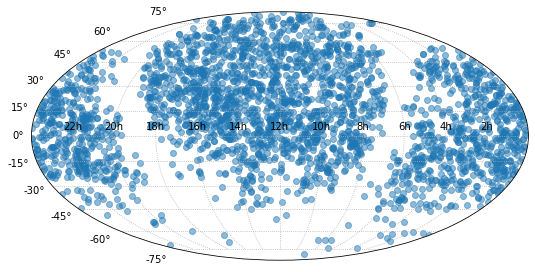

In [9]:
fig = plot_radec(tns_classified_coords.ra.to_value('deg'), tns_classified_coords.dec.to_value('deg'))

In [10]:
label, count = np.unique(tns_classified['Obj. Type'], return_counts=True)
idx = np.argsort(-count)
for l, c in zip(label[idx], count[idx]):
    print('{:15s} {:4d}'.format(l, c))

SN Ia           1826
SN II            418
SN IIn            91
SN Ia-91T-like    75
SN Ic             49
SN Ib             49
SN IIb            48
SLSN-I            32
SN IIP            32
SN Ia-91bg-like   29
SN Ic-BL          25
SN I              19
SN Ib/c           17
SN Ia-pec         16
SN                12
SN Ibn            12
SN Iax[02cx-like]    8
SLSN-II            7
SN II-pec          5
SN Ia-CSM          4
SN Ib-pec          4
SN IIn-pec         2
SN Ia-SC           2
SN Icn             2


In [11]:
desitrip_logs = sorted(glob('/global/project/projectdirs/desi/science/td/daily-search/desitrip/out/transient_candidate*.fits'))

In [13]:
matched_classified = None

for desitrip_log in desitrip_logs:
    fmap = Table.read(desitrip_log, 'FIBERMAP')
    desi_coords = SkyCoord(ra=fmap['TARGET_RA'], dec=fmap['TARGET_DEC'], unit='degree')
    
    tokens = os.path.basename(desitrip_log).split('_')
    night = int(tokens[3])
    tile  = int(tokens[4][:-5])
    
    idx, sep2d, sep3d = match_coordinates_sky(desi_coords, tns_classified_coords)
    select = sep2d < 15*u.arcsec
    if np.any(select):
        fmap['NIGHT'] = night
        fmap['TILEID'] = tile
        
        print(f'{os.path.basename(desitrip_log)}: {np.sum(select)} match(es) to TNS')
        matches = hstack([fmap[select], tns_classified[idx[select]]])
        
        if matched_classified is None:
            matched_classified = matches
        else:
            matched_classified = vstack([matched_classified, matches])

transient_candidate_spectra_20210410_228.fits: 1 match(es) to TNS
transient_candidate_spectra_20210521_20750.fits: 1 match(es) to TNS
transient_candidate_spectra_20210628_20895.fits: 1 match(es) to TNS
transient_candidate_spectra_20210923_21224.fits: 1 match(es) to TNS
transient_candidate_spectra_20210928_25538.fits: 1 match(es) to TNS
transient_candidate_spectra_20211001_24011.fits: 1 match(es) to TNS


In [14]:
matched_classified['TARGETID', 'TILEID', 'NIGHT', 'TARGET_RA', 'TARGET_DEC', 'Z', 'CNNLABEL', 'Obj. Type', 'Name', 'Discovery Date (UT)']

TARGETID,TILEID,NIGHT,TARGET_RA,TARGET_DEC,Z,CNNLABEL,Obj. Type,Name,Discovery Date (UT)
int64,int64,int64,float64,float64,float64,bytes8,str17,str11,str23
39627740042757408,228,20210410,216.56181194365672,-1.9650402170083148,0.2571663908341615,SN IIP,SN Ia,SN 2021slh,2021-07-05 06:05:02.003
39632941629837556,20750,20210521,246.3018744599368,32.94229128631957,0.08715405612181641,SN Ia,SN Ia,SN 2021lhg,2021-05-02 08:13:20.001
39633200862986949,20895,20210628,265.4929598226513,47.10456378563204,0.07266314115992102,SN Ia,SN Ia,SN 2021qtc,2021-06-21 08:23:03.002
39628025112824774,21224,20210923,347.4818817902204,9.687846907152528,0.06429891885459069,SN Ic,SN Ic-BL,SN 2021aabp,2021-09-30 06:08:45.001
39627753741354945,25538,20210928,313.04889192922076,-1.5931506797991892,0.0955245341976881,SN Ia,SN Ia,SN 2021yew,2021-09-05 05:59:08.000
39632996944316930,24011,20211001,274.41081647241185,35.79014950637152,0.06718711616935322,SN Ia,SN Ia,SN 2021yqm,2021-09-11 04:15:22.997


INFO:spectra.py:282:read_spectra: iotime 0.210 sec to read transient_candidate_spectra_20210410_228.fits at 2021-12-05T12:22:26.611896
216.56181194365672 -1.9650402170083148
216d33m43.65s -1d57m59.65s
INFO:spectra.py:282:read_spectra: iotime 0.108 sec to read transient_candidate_spectra_20210521_20750.fits at 2021-12-05T12:22:27.500803
246.3018744599368 32.94229128631957
246d18m08.25s 32d56m32.46s
INFO:spectra.py:282:read_spectra: iotime 0.116 sec to read transient_candidate_spectra_20210628_20895.fits at 2021-12-05T12:22:28.140290
265.4929598226513 47.10456378563204
265d29m34.755s 47d06m16.19s
INFO:spectra.py:282:read_spectra: iotime 0.245 sec to read transient_candidate_spectra_20210923_21224.fits at 2021-12-05T12:22:28.913815
347.4818817902204 9.687846907152528
347d28m46.335s 9d41m08.9s
INFO:spectra.py:282:read_spectra: iotime 0.079 sec to read transient_candidate_spectra_20210928_25538.fits at 2021-12-05T12:22:29.579549
313.04889192922076 -1.5931506797991892
313d02m55.395s -1d35m35

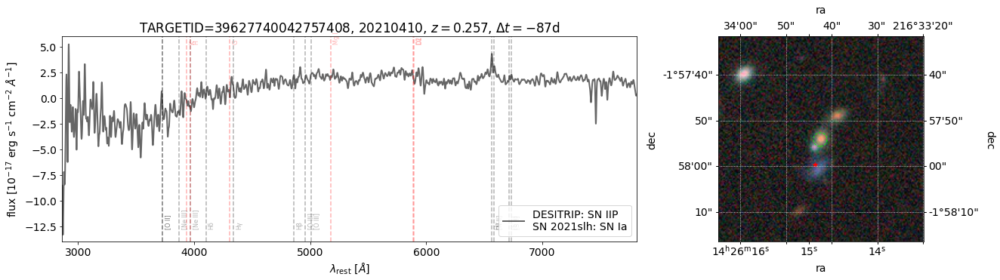

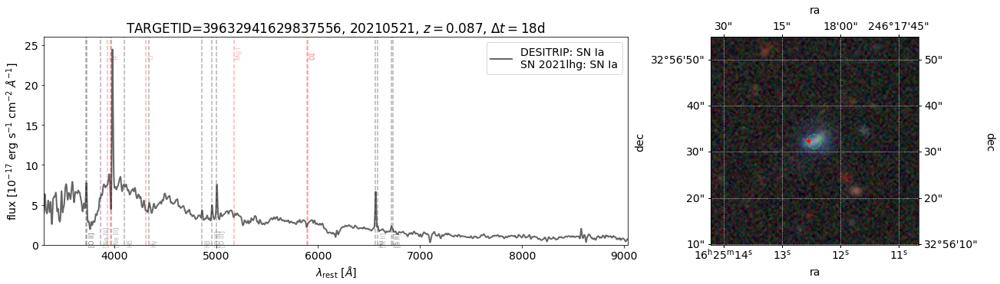

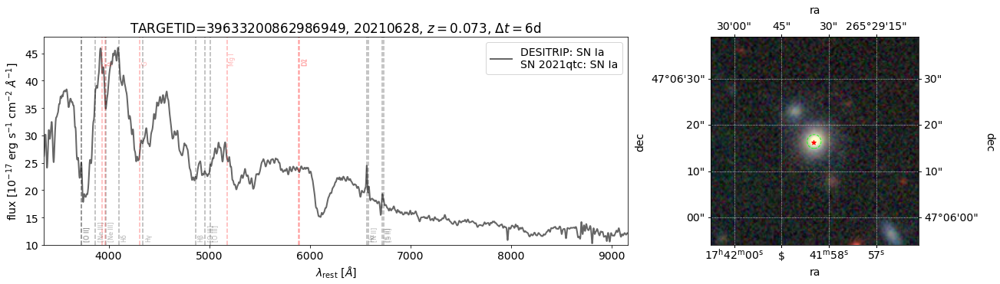

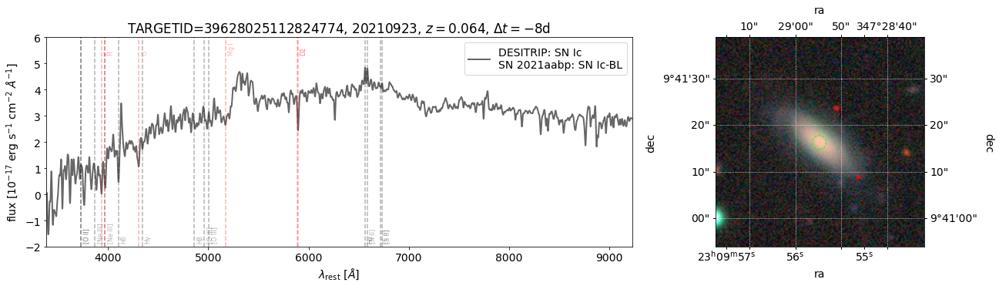

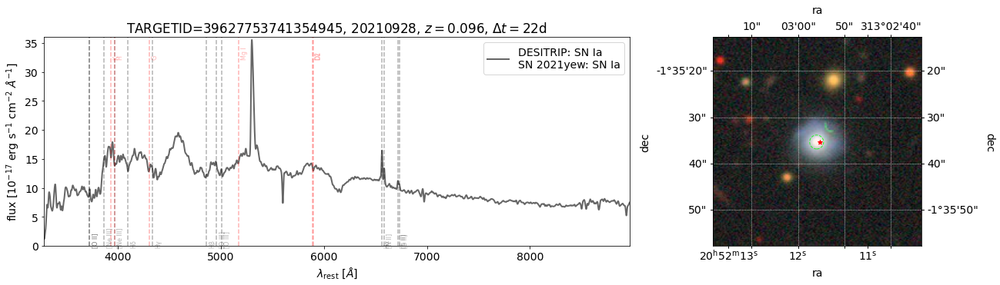

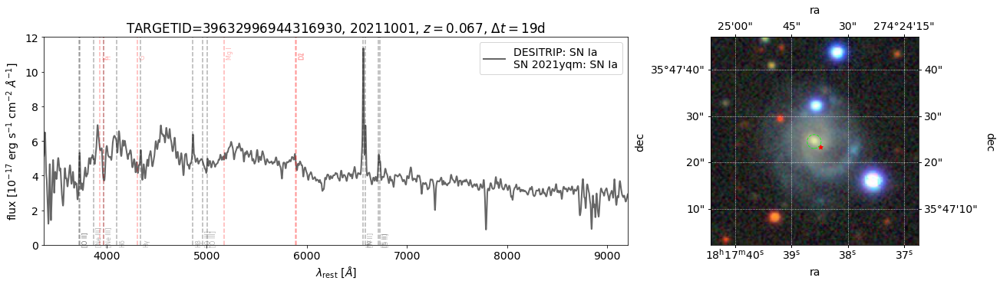

In [15]:
plot_alert_spectra(matched_classified, savefig=True)

## Match Against All TNS Candidates from 2021

In [16]:
tns_all = Table.read('../../../tns/tns_all_alerts.csv', format='csv')
tns_all

ID,Name,RA,DEC,Obj. Type,Redshift,Host Name,Host Redshift,Reporting Group/s,Discovery Data Source/s,Classifying Group/s,Associated Group/s,Disc. Internal Name,Disc. Instrument/s,Class. Instrument/s,TNS AT,Public,End Prop. Period,Discovery Mag/Flux,Discovery Filter,Discovery Date (UT),Sender,Remarks,Ext. catalog/s
int64,str11,str12,str12,str17,float64,str32,float64,str59,str52,str33,str52,str29,str107,str52,int64,int64,str10,float64,str12,str23,str20,str134,int64
97243,AT 2021afut,14:27:13.691,+11:20:14.77,--,--,--,--,ZTF,ZTF,--,ZTF,ZTF21acrcigm,P48 - ZTF-Cam,--,1,1,--,19.09,r-ZTF,2021-11-22 13:24:57.600,ZTF_Bot1,--,--
97242,AT 2021afus,08:02:34.183,+14:21:29.24,--,--,SDSS J080234.16+142129.0,--,SGLF,ZTF,--,SGLF,ZTF21acpvtgf,P48 - ZTF-Cam,--,1,1,--,20.352,r-ZTF,2021-11-18 11:35:15.000,Perez-Fournon,--,--
97241,AT 2021afur,10:22:12.998,+17:51:40.41,--,--,--,--,AMPEL,ZTF,--,AMPEL,ZTF21acqgsri,P48 - ZTF-Cam,--,1,1,--,20.32,g-ZTF,2021-12-02 11:09:29.952,ZTF_AMPEL_NEW,--,--
97240,AT 2021afuq,10:27:51.994,-43:54:06.70,--,--,NGC 3256,0.0093,ASAS-SN,ASAS-SN,--,ASAS-SN,ASASN-21vr,ASASSN-2 - Cassius,--,1,1,--,16.0,g-Sloan,2021-12-02 06:43:12.000,Stanek,--,--
97239,AT 2021afup,11:14:07.381,-00:00:31.25,--,--,--,--,AMPEL,ZTF,--,AMPEL,ZTF20acrkvuj,P48 - ZTF-Cam,--,1,1,--,17.69,r-ZTF,2021-11-07 12:49:00.192,ZTF_AMPEL_COMPLETE,--,--
97238,AT 2021afuo,22:32:10.741,-20:07:27.67,--,--,--,--,ZTF,ZTF,--,ZTF,ZTF21acqpcmx,P48 - ZTF-Cam,--,1,1,--,18.93,r-ZTF,2021-12-02 02:31:12.000,ZTF_Bot1,--,--
97237,AT 2021afun,22:36:56.158,-08:51:15.46,--,--,--,--,ZTF,ZTF,--,ZTF,ZTF19abkznam,P48 - ZTF-Cam,--,1,1,--,19.41,r-ZTF,2021-12-02 02:28:19.200,ZTF_Bot1,--,--
97236,AT 2021afum,22:47:47.226,+23:45:34.04,--,--,--,--,ZTF,ZTF,--,ZTF,ZTF21acqitdd,P48 - ZTF-Cam,--,1,1,--,19.52,r-ZTF,2021-12-02 02:41:16.800,ZTF_Bot1,--,--
97235,AT 2021aful,05:28:49.227,-15:32:27.82,--,--,--,--,ZTF,ZTF,--,ZTF,ZTF21acqschz,P48 - ZTF-Cam,--,1,1,--,20.4,g-ZTF,2021-11-19 09:36:00.000,ZTF_Bot1,--,--


In [17]:
tns_all_coords = SkyCoord(ra=tns_all['RA'], dec=tns_all['DEC'], unit=['hourangle', 'degree'])

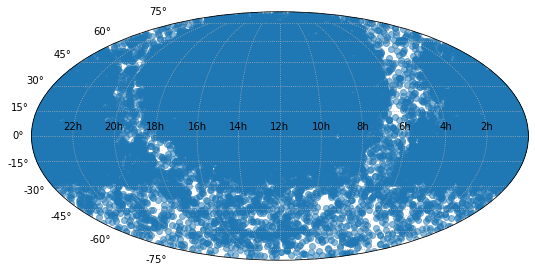

In [18]:
fig = plot_radec(tns_all_coords.ra.to_value('deg'), tns_all_coords.dec.to_value('deg'))

In [20]:
matched_all = None

for desitrip_log in desitrip_logs:
    fmap = Table.read(desitrip_log, 'FIBERMAP')
    desi_coords = SkyCoord(ra=fmap['TARGET_RA'], dec=fmap['TARGET_DEC'], unit='degree')
    
    tokens = os.path.basename(desitrip_log).split('_')
    night = int(tokens[3])
    tile  = int(tokens[4][:-5])
    
    idx, sep2d, sep3d = match_coordinates_sky(desi_coords, tns_all_coords)
    select = sep2d < 15*u.arcsec
    if np.any(select):
        fmap['NIGHT'] = night
        fmap['TILEID'] = tile
        
        print(f'{os.path.basename(desitrip_log)}: {np.sum(select)} match(es) to TNS')
        matches = hstack([fmap[select], tns_all[idx[select]]])
        
        if matched_all is None:
            matched_all = matches
        else:
            matched_all = vstack([matched_all, matches])

transient_candidate_spectra_20210208_80664.fits: 1 match(es) to TNS
transient_candidate_spectra_20210409_310.fits: 1 match(es) to TNS
transient_candidate_spectra_20210410_228.fits: 2 match(es) to TNS
transient_candidate_spectra_20210430_261.fits: 1 match(es) to TNS
transient_candidate_spectra_20210506_127.fits: 1 match(es) to TNS
transient_candidate_spectra_20210506_290.fits: 1 match(es) to TNS
transient_candidate_spectra_20210521_20750.fits: 1 match(es) to TNS
transient_candidate_spectra_20210522_20774.fits: 1 match(es) to TNS
transient_candidate_spectra_20210603_20102.fits: 1 match(es) to TNS
transient_candidate_spectra_20210610_20823.fits: 1 match(es) to TNS
transient_candidate_spectra_20210612_20081.fits: 1 match(es) to TNS
transient_candidate_spectra_20210613_20100.fits: 1 match(es) to TNS
transient_candidate_spectra_20210619_20733.fits: 1 match(es) to TNS
transient_candidate_spectra_20210620_20903.fits: 1 match(es) to TNS
transient_candidate_spectra_20210626_20303.fits: 1 match(e

In [21]:
matched_all['TARGETID', 'TILEID', 'NIGHT', 'TARGET_RA', 'TARGET_DEC', 'Z', 'CNNLABEL', 'Obj. Type', 'Name']

TARGETID,TILEID,NIGHT,TARGET_RA,TARGET_DEC,Z,CNNLABEL,Obj. Type,Name
int64,int64,int64,float64,float64,float64,bytes8,str17,str11
39628438574727938,80664,20210208,191.91377896220223,28.064035733063353,0.09086914513521518,SN Ia,--,AT 2021cpa
39633322489414356,310,20210409,243.40895704693796,55.01404164011459,0.14488975844071048,SN IIP,--,AT 2021vtu
39627740042757408,228,20210410,216.56181194365672,-1.9650402170083148,0.2571663908341615,SN IIP,SN Ia,SN 2021slh
39627788365334623,228,20210410,216.83538181114346,-0.12035730668141444,0.21532114010583095,SN IIP,--,AT 2021jhy
43977432268538011,261,20210430,220.5268,-0.9185,0.14185985598329834,SN IIP,--,AT 2021jfp
39628454601162986,127,20210506,195.9649030293305,28.727892050331157,0.14278574894035354,SN Ia,--,AT 2021lqw
43977504712556932,290,20210506,218.5278,2.0666,0.18611828543877446,SN IIP,--,AT 2021jxk
39632941629837556,20750,20210521,246.3018744599368,32.94229128631957,0.08715405612181641,SN Ia,SN Ia,SN 2021lhg
39633104960229342,20774,20210522,222.5810782198379,41.56246692740844,0.20252053024586375,SN IIP,--,AT 2021rmi


In [22]:
np.sum(matched_all['Obj. Type'].mask) / len(matched_all)

0.8235294117647058

INFO:spectra.py:282:read_spectra: iotime 0.083 sec to read transient_candidate_spectra_20210208_80664.fits at 2021-12-05T12:28:45.402287
191.91377896220223 28.064035733063353
191d54m50.07s 28d03m51.27s
INFO:spectra.py:282:read_spectra: iotime 0.141 sec to read transient_candidate_spectra_20210409_310.fits at 2021-12-05T12:28:46.163389
243.40895704693796 55.01404164011459
243d24m36.15s 55d00m49.14s
INFO:spectra.py:282:read_spectra: iotime 0.241 sec to read transient_candidate_spectra_20210410_228.fits at 2021-12-05T12:28:46.983303
216.56181194365672 -1.9650402170083148
216d33m43.65s -1d57m59.65s
INFO:spectra.py:282:read_spectra: iotime 0.149 sec to read transient_candidate_spectra_20210410_228.fits at 2021-12-05T12:28:47.776626
216.83538181114346 -0.12035730668141444
216d50m08.52s -0d07m13.08s
INFO:spectra.py:282:read_spectra: iotime 0.110 sec to read transient_candidate_spectra_20210430_261.fits at 2021-12-05T12:28:48.498580
220.5268 -0.9185
220d31m36.48s -0d55m06.6s
INFO:spectra.py:28

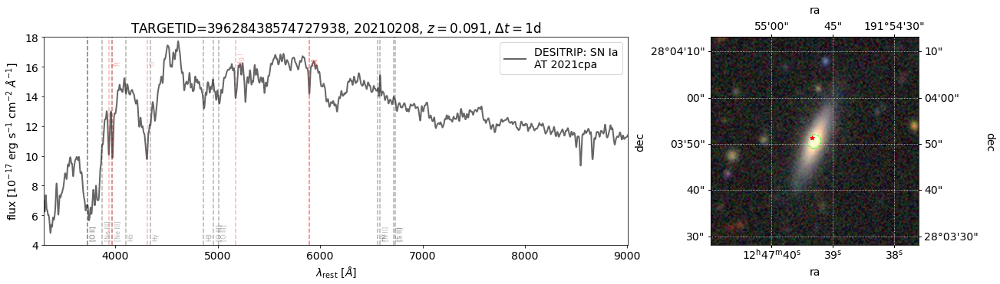

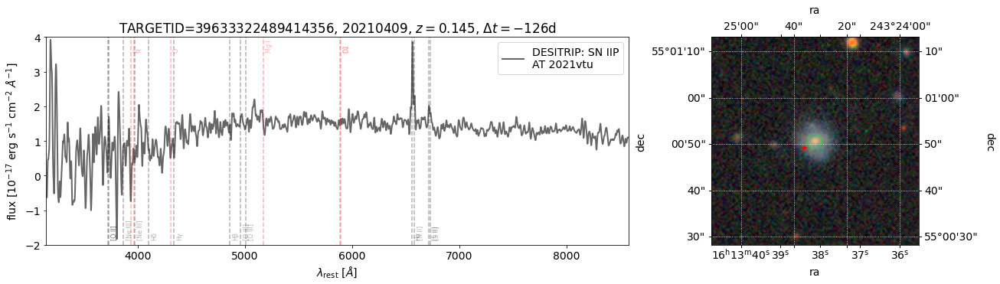

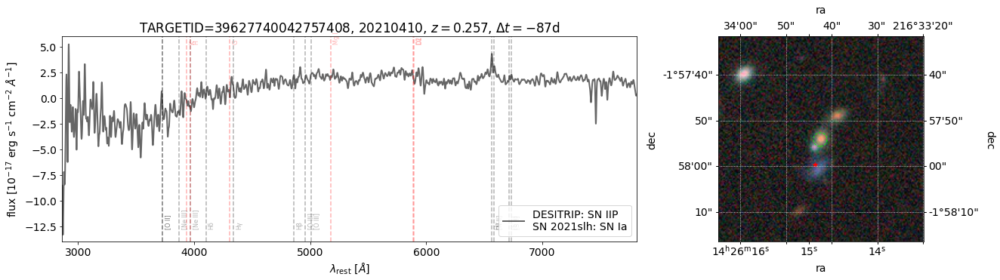

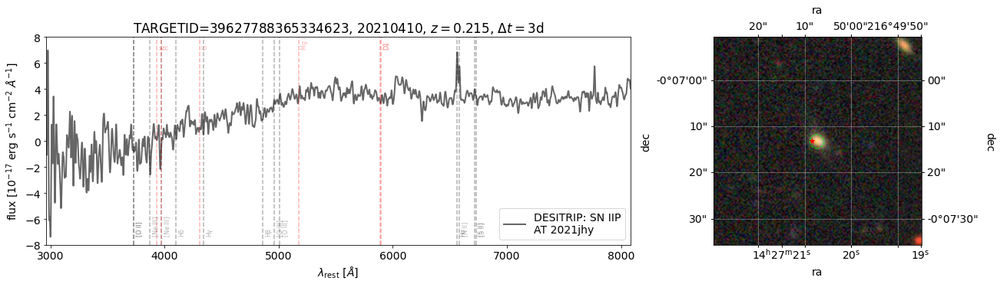

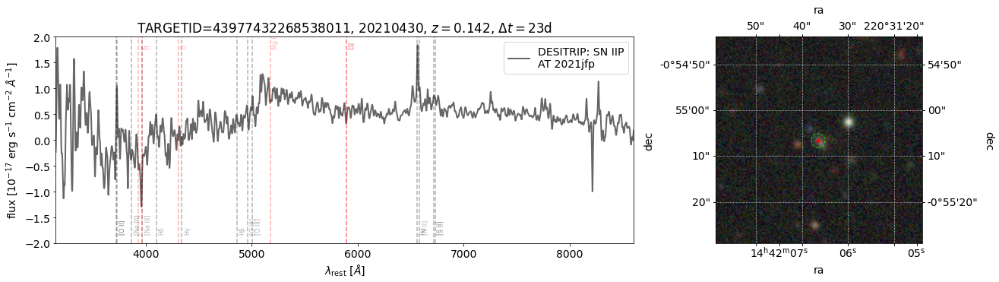

...

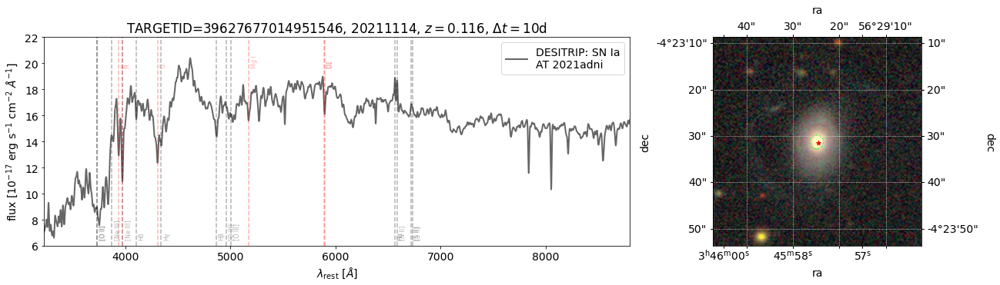

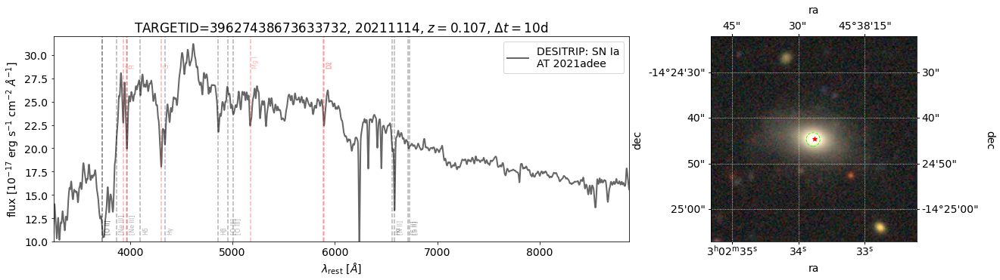

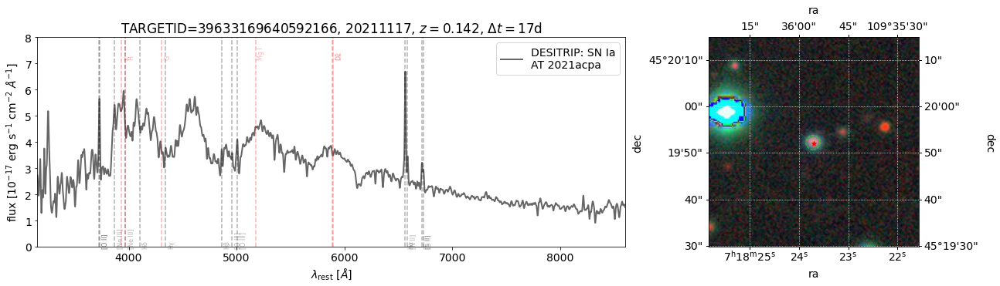

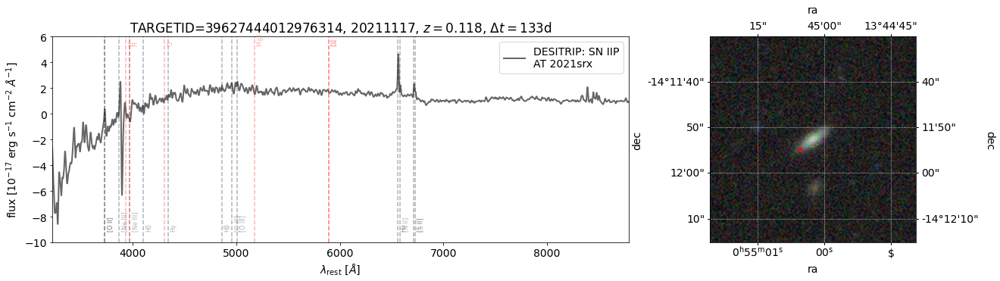

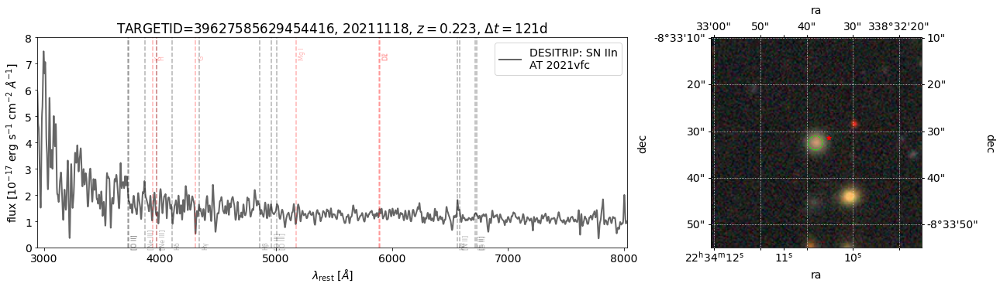

In [23]:
plot_alert_spectra(matched_all, savefig=True)